In [1]:
import warnings
warnings.filterwarnings("ignore")

In [15]:
import tensorflow as tf  # Import TensorFlow, a deep learning framework.
from tensorflow.keras.preprocessing.image import ImageDataGenerator  # Import ImageDataGenerator for data augmentation.
from tensorflow.keras.models import Sequential  # Create a sequential neural network model.
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense  # Define layers for the neural network.
from tensorflow.keras.initializers import GlorotNormal  # Initialize layer weights using Glorot Normal initialization.
from tensorflow.keras.initializers import HeNormal  # Initialize layer weights using He Normal initialization.

from tensorflow.keras.layers import Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

initializer = HeNormal()

In [3]:
train_dir = '/kaggle/input/agricultural-crops-image-classification/Agricultural-crops' # Path to parent folder containing all folder of crops

Crop: tomato


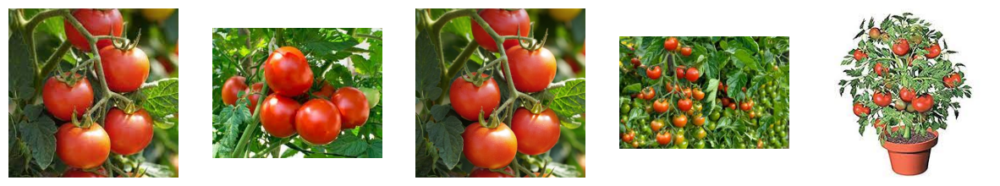

Crop: chilli


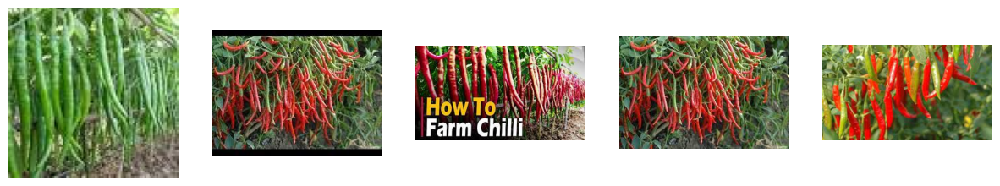

Crop: clove


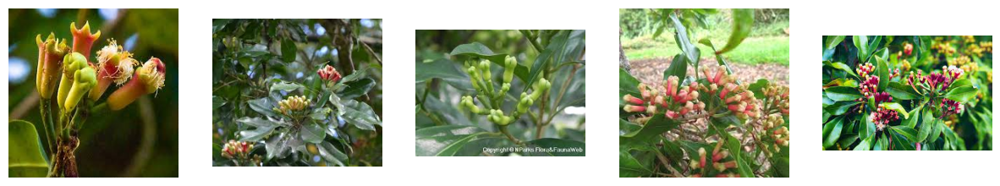

Crop: pineapple


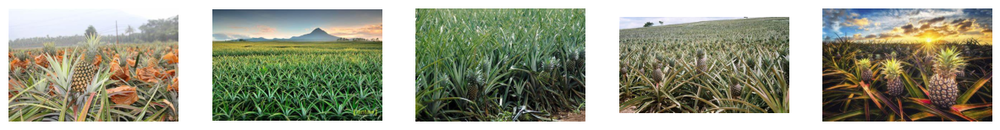

Crop: vigna-radiati(Mung)


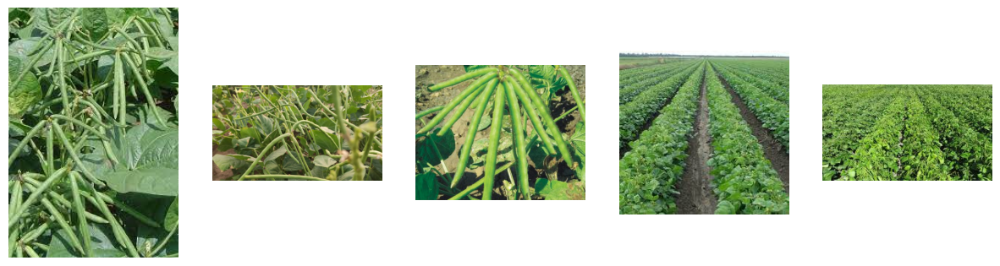

Crop: Olive-tree


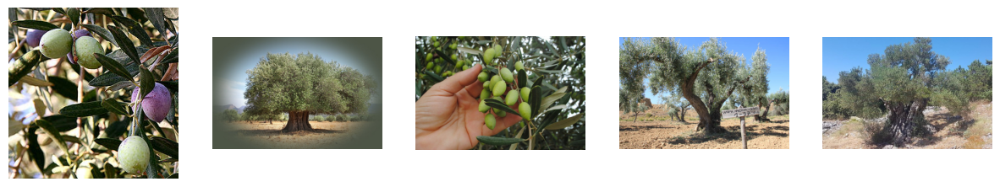

Crop: coconut


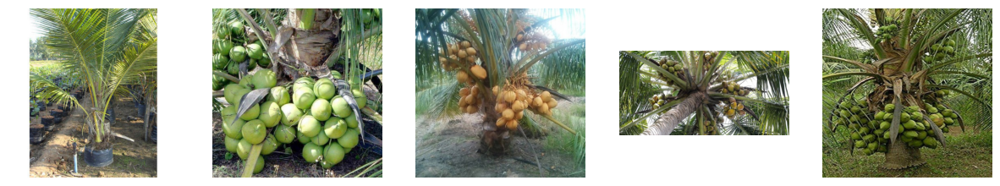

Crop: papaya


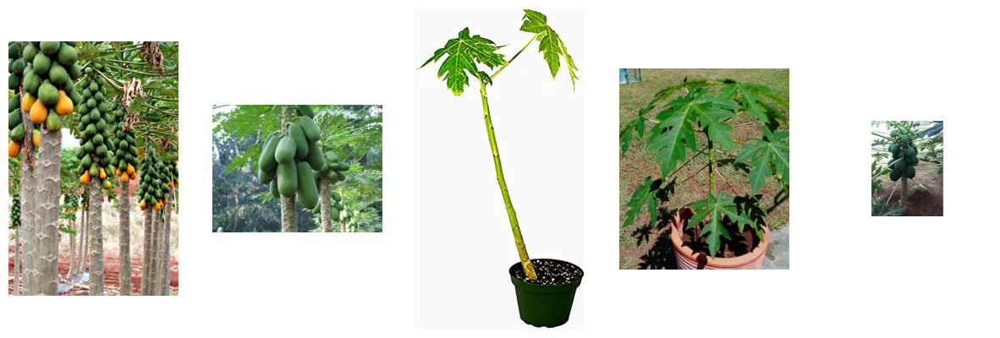

Crop: Tobacco-plant


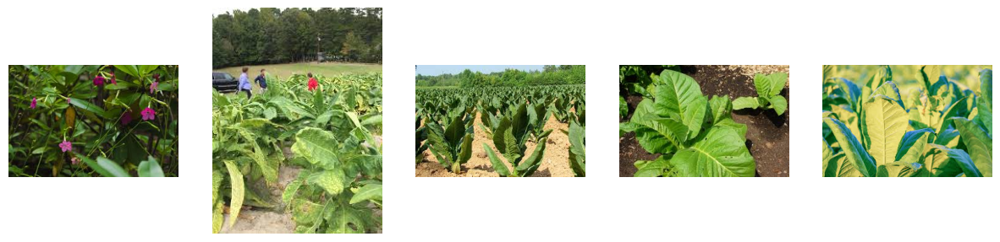

Crop: jute


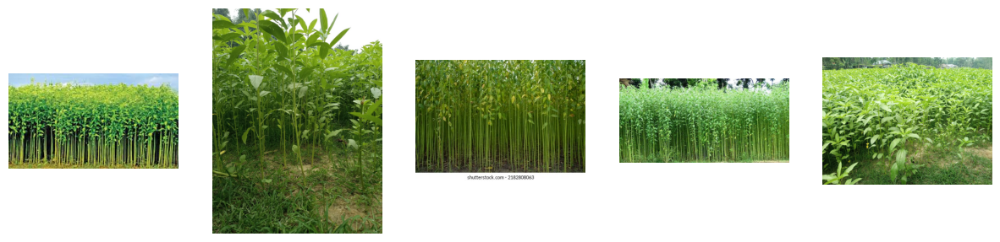

Crop: jowar


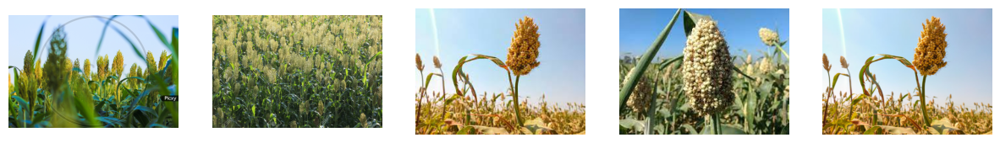

Crop: gram


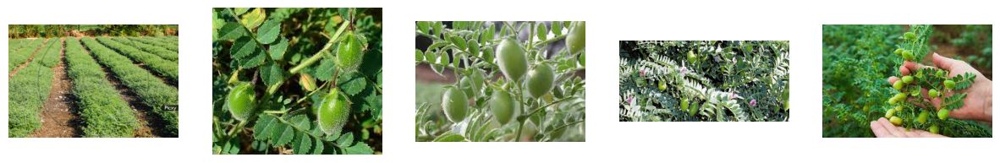

Crop: tea


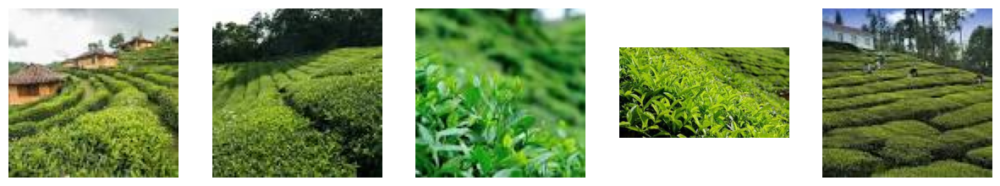

Crop: maize


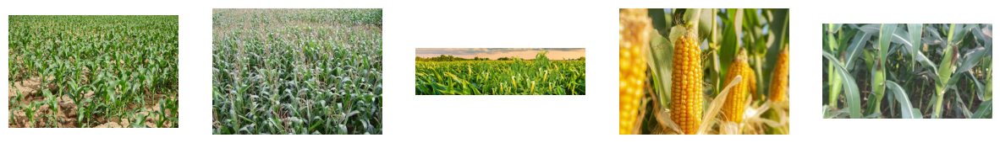

Crop: wheat


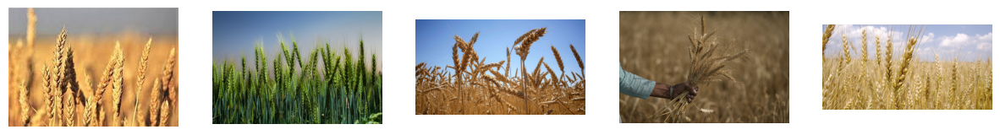

Crop: soyabean


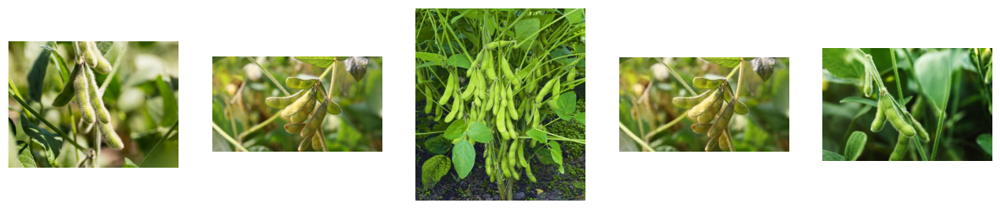

Crop: Pearl_millet(bajra)


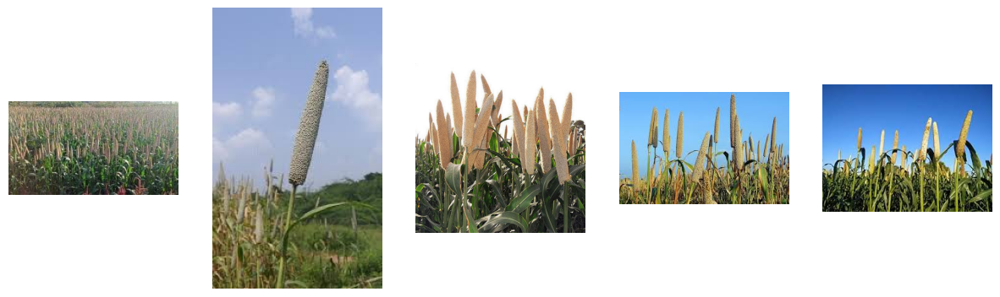

Crop: Lemon


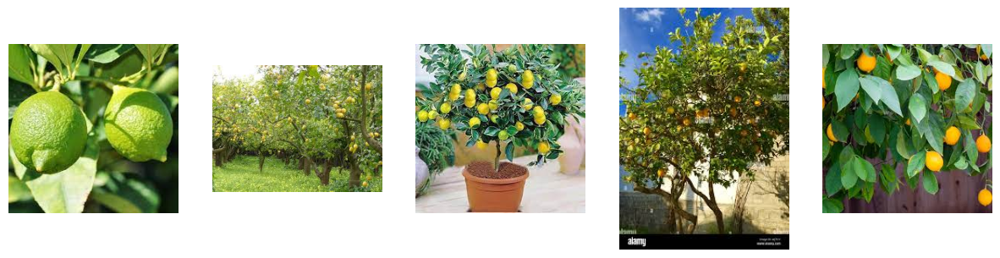

Crop: Fox_nut(Makhana)


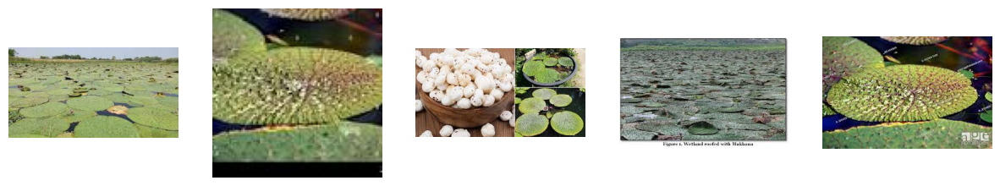

Crop: mustard-oil


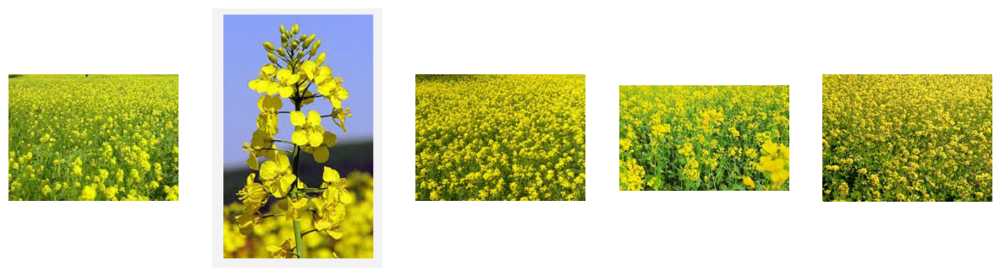

Crop: sugarcane


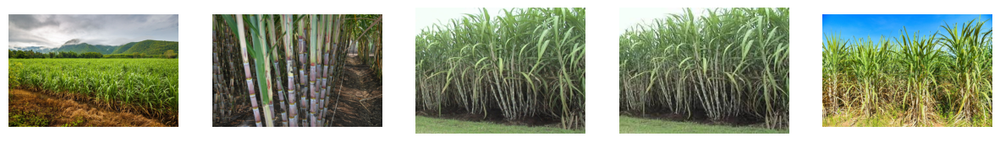

Crop: almond


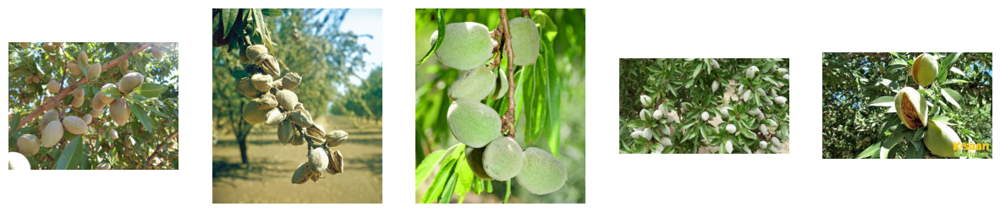

Crop: Cucumber


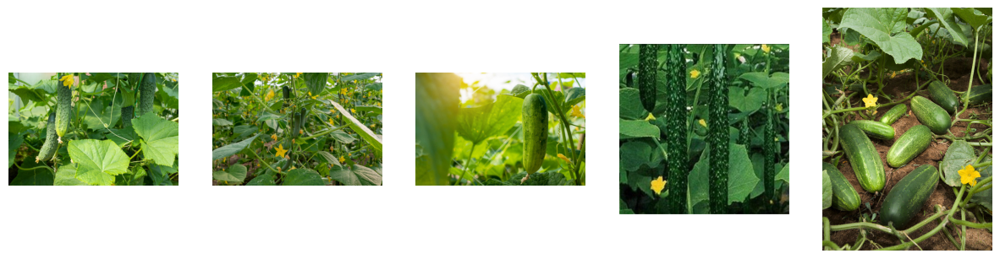

Crop: sunflower


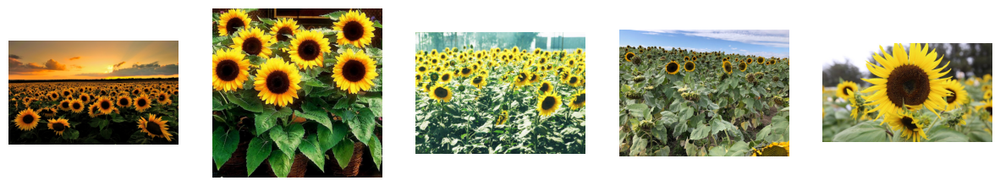

Crop: cotton


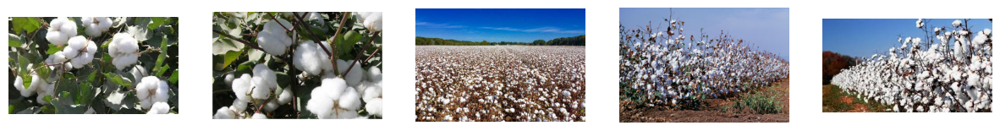

Crop: banana


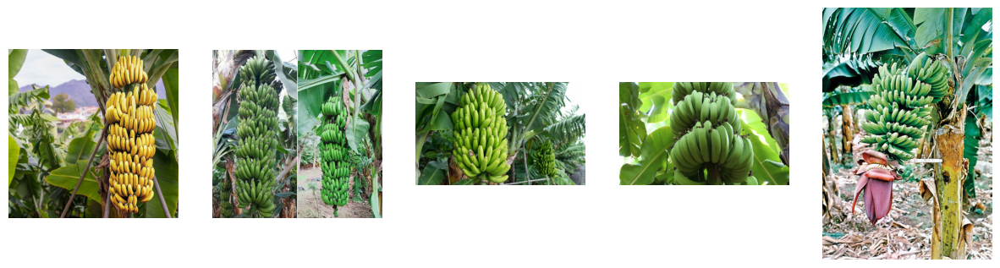

Crop: Cherry


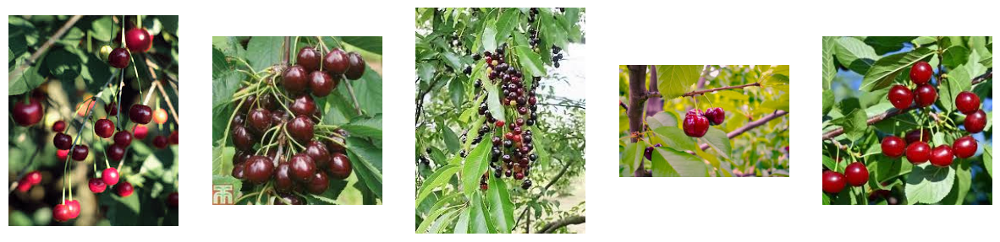

Crop: cardamom


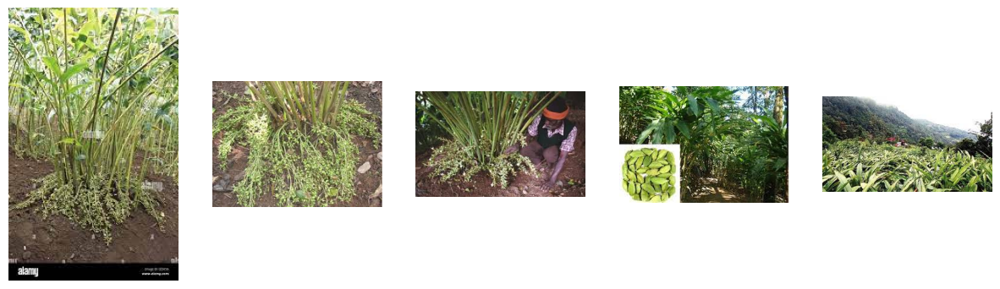

Crop: rice


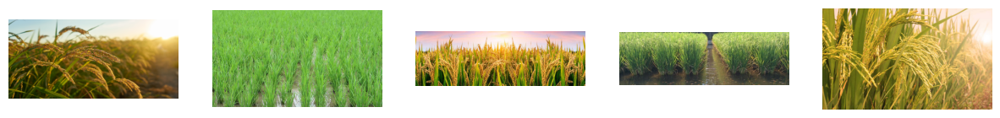

Crop: Coffee-plant


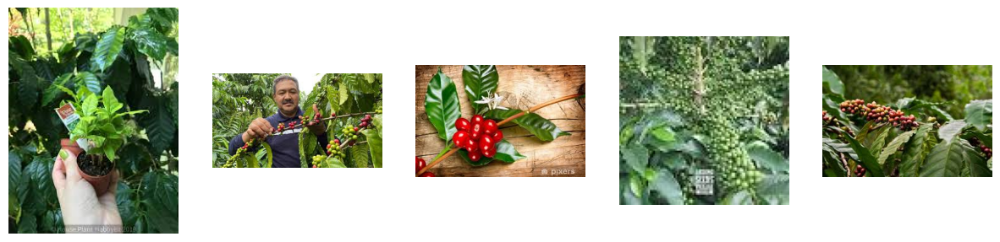

In [14]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

parent_dir = '/kaggle/input/agricultural-crops-image-classification/Agricultural-crops'
subfolders = [folder for folder in os.listdir(parent_dir) if os.path.isdir(os.path.join(parent_dir, folder))]

num_images_per_crop = 5

for subfolder in subfolders:
    crop_dir = os.path.join(parent_dir, subfolder)
    image_files = [os.path.join(crop_dir, filename) for filename in os.listdir(crop_dir) if os.path.isfile(os.path.join(crop_dir, filename))]

    if len(image_files) >= num_images_per_crop:
        random_images = random.sample(image_files, num_images_per_crop)

        print(f"Crop: {subfolder}")

        plt.figure(figsize=(15, 5))

        for i, image_path in enumerate(random_images):
            plt.subplot(1, num_images_per_crop, i + 1)
            img = mpimg.imread(image_path)
            plt.imshow(img)
            plt.axis('off')

        plt.show()

In [4]:
train_datagen = ImageDataGenerator(
    rescale=1.0/255,
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

In [5]:
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(150, 150),
    batch_size=32,
    class_mode='categorical'
)

Found 829 images belonging to 30 classes.


In [16]:
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', kernel_initializer=initializer, input_shape=(150, 150, 3)),
    MaxPooling2D(2, 2),
    BatchNormalization(),
    Conv2D(64, (3, 3), activation='relu', kernel_initializer=initializer),
    MaxPooling2D(2, 2),
    BatchNormalization(),
    Conv2D(128, (3, 3), activation='relu', kernel_initializer=initializer),
    MaxPooling2D(2, 2),
    BatchNormalization(),
    Flatten(),
    Dense(512, activation='relu', kernel_initializer=initializer, kernel_regularizer=l2(0.001)),
    Dropout(0.5),
    Dense(30, activation='softmax')
])

In [17]:
optimizer = Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [22]:
num_epochs = 10
history = model.fit(
    train_generator,
    steps_per_epoch=len(train_generator),
    epochs=num_epochs,
    verbose=1
)

Epoch 1/10
26/26 [==============================] - 8s 319ms/step - loss: 6.0307 - accuracy: 0.4246
Epoch 2/10
26/26 [==============================] - 8s 309ms/step - loss: 5.7629 - accuracy: 0.4608
Epoch 3/10
26/26 [==============================] - 9s 337ms/step - loss: 5.7224 - accuracy: 0.4885
Epoch 4/10
26/26 [==============================] - 8s 313ms/step - loss: 5.6688 - accuracy: 0.5054
Epoch 5/10
26/26 [==============================] - 8s 309ms/step - loss: 5.6268 - accuracy: 0.4861
Epoch 6/10
26/26 [==============================] - 8s 308ms/step - loss: 5.6197 - accuracy: 0.4837
Epoch 7/10
26/26 [==============================] - 9s 333ms/step - loss: 5.4730 - accuracy: 0.5332
Epoch 8/10
26/26 [==============================] - 8s 315ms/step - loss: 5.5083 - accuracy: 0.5223
Epoch 9/10
26/26 [==============================] - 8s 314ms/step - loss: 5.6047 - accuracy: 0.5308
Epoch 10/10
26/26 [==============================] - 8s 311ms/step - loss: 5.4306 - accuracy: 0.5308

In [23]:
history.history

{'loss': [6.030728340148926,
  5.7628560066223145,
  5.722350120544434,
  5.668764591217041,
  5.626773357391357,
  5.619657039642334,
  5.473047256469727,
  5.508307456970215,
  5.604654312133789,
  5.430624485015869],
 'accuracy': [0.4246079623699188,
  0.46079614758491516,
  0.4885404109954834,
  0.5054282546043396,
  0.4861278533935547,
  0.48371532559394836,
  0.5331724882125854,
  0.522316038608551,
  0.5307599306106567,
  0.5307599306106567]}

In [24]:
train_loss, train_accuracy = model.evaluate(train_generator, steps=len(train_generator))

print(f"Training Loss: {train_loss:.4f}")
print(f"Training Accuracy: {train_accuracy:.4f}")

26/26 [==============================] - 8s 313ms/step - loss: 4.7206 - accuracy: 0.7069
Training Loss: 4.7206
Training Accuracy: 0.7069
